**<h1> Manipulating Images </h1>**


Estimated time needed: **60** minutes


<h2>Objectives</h2>


In this lab, you will learn how to manipulate images, both as arrays and PIL image objects. You will learn how to copy an image to avoid aliasing. We will cover flipping images and cropping images. You will also learn to change pixel images; this will allow you to draw shapes, write text and superimpose images over other images.


<ul>
    <li><a href='#MI'>Manipulating Images </a>
        <ul>
            <li>Copying Images  </li>
            <li>Fliping Images </li>
            <li>Cropping an Image </li>
            <li>Changing Specific Image Pixels </li>
     
  
    
</ul>


----


Download the images for the lab:


In [ ]:
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/cat.png -O cat.png
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/lenna.png -O lenna.png
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/baboon.png -O baboon.png

We will be using these imported functions in the lab:


In [1]:
import matplotlib.pyplot as plt   # Dùng để hiển thị ảnh, vẽ biểu đồ
from PIL import Image             # Dùng để mở và xử lý ảnh
import numpy as np                # Dùng để xử lý dữ liệu dạng mảng (ma trận)


## Copying Images


If you want to reassign an array to another variable, you should use the `copy` method. 


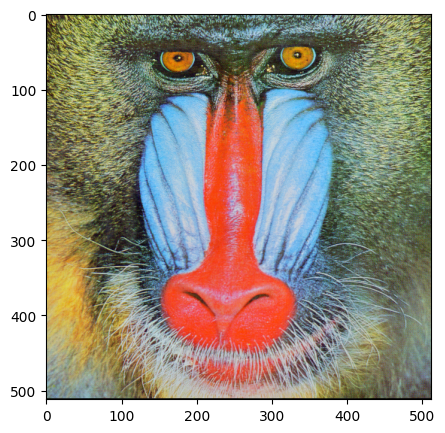

In [2]:
baboon = np.array(Image.open('baboon.png'))  # Mở file ảnh và chuyển ảnh thành mảng NumPy
plt.figure(figsize=(5,5))                    # Tạo khung hiển thị kích thước 5x5 inch
plt.imshow(baboon)                           # Hiển thị ảnh từ mảng
plt.show()                                   # Hiển thị ảnh ra màn hình


If we do not apply the method `copy()`, the two variables would point to the same location in memory:


In [4]:
A = baboon  # Gán dữ liệu ảnh baboon cho biến A

We use the  `id`  function to find a variable's memory address; we see the objects in the memory space which the variables `A` and `baboon` point to are the same.


In [5]:
id(A) == id(baboon) # Kiểm tra xem A và baboon có trỏ đến cùng một vùng nhớ hay không

True

However, if we apply method `copy()`, their memory addresses are different.


In [6]:
B = baboon.copy()          # Tạo một bản sao mới của baboon và gán cho B
id(B) == id(baboon)        # Kiểm tra B và baboon có cùng vùng nhớ hay không


False

There may be unexpected behaviours when two variables point to the same object in memory. Consider the array `baboon`. If we set all its entries to zero, all entires in `A` will become zero as well. However, as `baboon` and `B` points to different objects, the values in `B` will not be affected. 


In [7]:
baboon[:,:,] = 0  # Gán tất cả giá trị pixel của ảnh về 0 → ảnh trở thành màu đen

We can compare the variables <code>baboon</code> and array <code>A</code>:


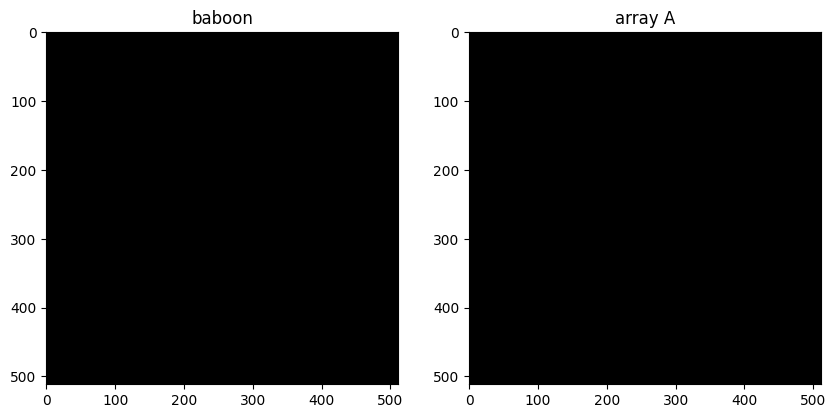

In [8]:
plt.figure(figsize=(10,10))     # Tạo khung hiển thị kích thước 10x10 inch
plt.subplot(121)                # Chia khung thành 1 hàng 2 cột, chọn ô thứ 1
plt.imshow(baboon)              # Hiển thị ảnh baboon
plt.title("baboon")             # Đặt tiêu đề cho ảnh
plt.subplot(122)                # Chọn ô thứ 2
plt.imshow(A)                   # Hiển thị ảnh A
plt.title("array A")            # Đặt tiêu đề cho ảnh
plt.show()                      # Hiển thị tất cả ảnh


We see they are the same. This behaviour is called aliasing. Aliasing happens whenever one variable's value is assigned to another variable. Variables are references to values on the memory. 

We can also compare <code>baboon</code> and array <code>B</code>:


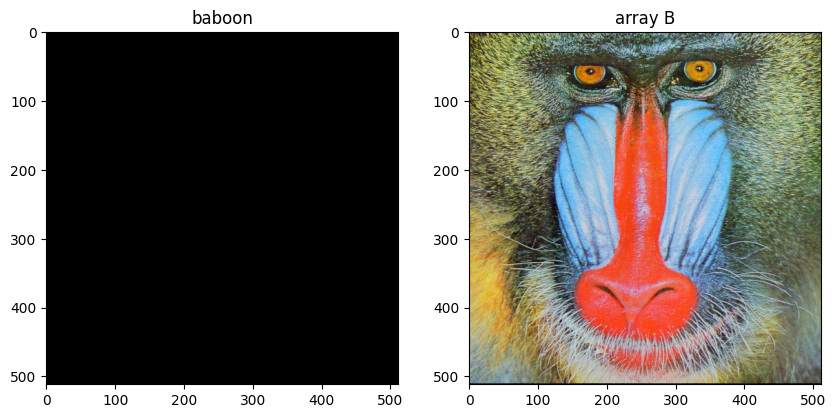

In [9]:
plt.figure(figsize=(10,10))     # Tạo khung hiển thị kích thước 10x10 inch
plt.subplot(121)                # Chia khung thành 1 hàng 2 cột, chọn ô thứ 1
plt.imshow(baboon)              # Hiển thị ảnh baboon
plt.title("baboon")             # Đặt tiêu đề cho ảnh
plt.subplot(122)                # Chọn ô thứ 2
plt.imshow(B)                   # Hiển thị ảnh B
plt.title("array B")            # Đặt tiêu đề cho ảnh
plt.show()                      # Hiển thị tất cả ảnh



If a PIL function does not return a new image, the same principle applies. We will go over some examples later on. 


## Flipping Images 


Flipping images involves reordering the indices of the pixels such that it changes the orientation of the image. Consider the following image:


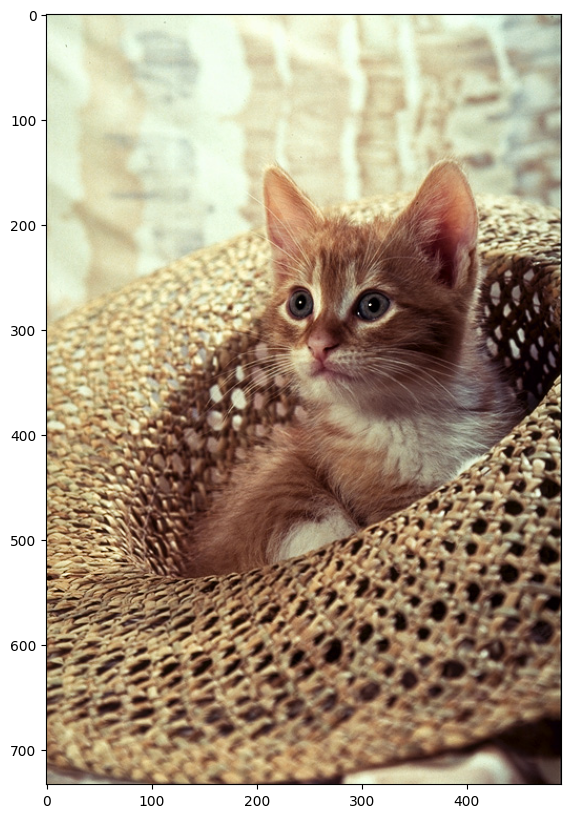

In [10]:
image = Image.open("cat.png")    # Mở file ảnh cat.png
plt.figure(figsize=(10,10))     # Tạo khung hiển thị kích thước 10x10 inch
plt.imshow(image)               # Hiển thị ảnh
plt.show()                      # Hiển thị ảnh ra màn hình


We can cast it to an array and find its shape:


In [11]:
array = np.array(image)                 # Chuyển ảnh từ dạng Image sang mảng NumPy
width, height, C = array.shape           # Lấy kích thước ảnh: rộng, cao và số kênh màu
print('width, height, C', width, height, C)  # In ra kích thước ảnh


width, height, C 733 490 3


Let's flip, i.e rotate vertically, the image. Let's try the traditional approach. First, we create an array of the same size with datatype <code>np.uint8</code>.


In [12]:
array_flip = np.zeros((width, height, C), dtype=np.uint8) #Tạo ảnh mới toàn giá trị 0, bằng kích thước ảnh gốc

We assign the first row of pixels of the original array to the new array’s last row. We repeat the process for every row, incrementing the row number from the original array and decreasing the new array’s row index to assign the pixels accordingly. After excecuting the for loop below, `array_flip` will become the flipped image. 


In [13]:
for i, row in enumerate(array):                 # Duyệt từng hàng của ảnh, i là chỉ số hàng
    array_flip[width - 1 - i, :, :] = row       # Gán hàng đó vào vị trí đối xứng → lật ảnh theo chiều dọc


<code>PIL</code> has several ways to flip an image, for example, we can use the <code>ImageOps</code> module:


In [ ]:
from PIL import ImageOps    # Import ImageOps để dùng các hàm xử lý ảnh có sẵn (lật, xoay, đảo màu…)


The `flip()` method of `ImageOps` module flips the image. The `mirror()` method will mirror  the image:


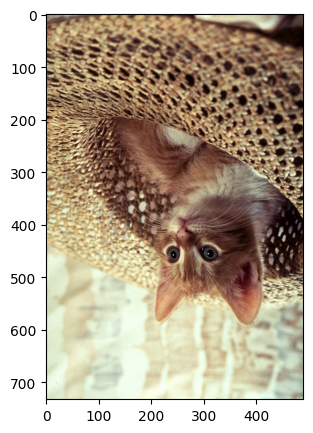

In [15]:
im_flip = ImageOps.flip(image)   # Lật ảnh theo chiều dọc bằng hàm có sẵn của PIL
plt.figure(figsize=(5,5))        # Tạo khung hiển thị 5x5 inch
plt.imshow(im_flip)              # Hiển thị ảnh đã lật
plt.show()                       # Hiển thị ảnh ra màn hình


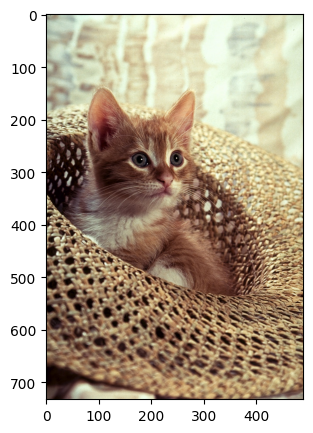

In [16]:
im_mirror = ImageOps.mirror(image)   # Lật ảnh theo chiều ngang (trái ↔ phải)
plt.figure(figsize=(5,5))            # Tạo khung hiển thị 5x5 inch
plt.imshow(im_mirror)                # Hiển thị ảnh đã lật
plt.show()                           # Hiển thị ảnh ra màn hình


We can use  the <code>transpose()</code> method; the parameter is an integer indicating what type of transposition we would like to perform. For example, we can flip the image using a value of `1`.


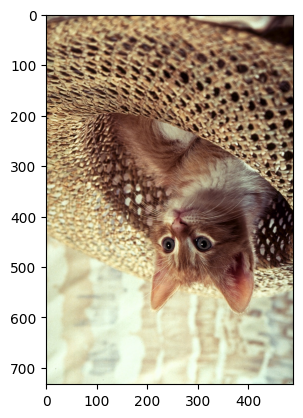

In [17]:
im_flip = image.transpose(1)   # Lật ảnh theo chiều dọc (trên ↔ dưới) bằng transpose
plt.imshow(im_flip)            # Hiển thị ảnh đã lật
plt.show()                     # Hiển thị ảnh ra màn hình


The Image module has built-in attributes that describe the type of flip. The values are just integers. Several are shown in the following <code>dict</code>:


In [19]:
flip = {
    "FLIP_LEFT_RIGHT": Image.FLIP_LEFT_RIGHT,   # Lật ảnh trái ↔ phải
    "FLIP_TOP_BOTTOM": Image.FLIP_TOP_BOTTOM,   # Lật ảnh trên ↔ dưới
    "ROTATE_90": Image.ROTATE_90,                # Xoay ảnh 90 độ
    "ROTATE_180": Image.ROTATE_180,              # Xoay ảnh 180 độ
    "ROTATE_270": Image.ROTATE_270,              # Xoay ảnh 270 độ
    "TRANSPOSE": Image.TRANSPOSE,                # Lật + xoay theo đường chéo
    "TRANSVERSE": Image.TRANSVERSE               # Lật + xoay theo đường chéo ngược
}


We see the values are integers.


In [21]:
flip["FLIP_LEFT_RIGHT"]   # Lấy giá trị hằng số dùng để lật ảnh trái ↔ phải trong PIL


0

We can plot each of the outputs using the different  parameter values:


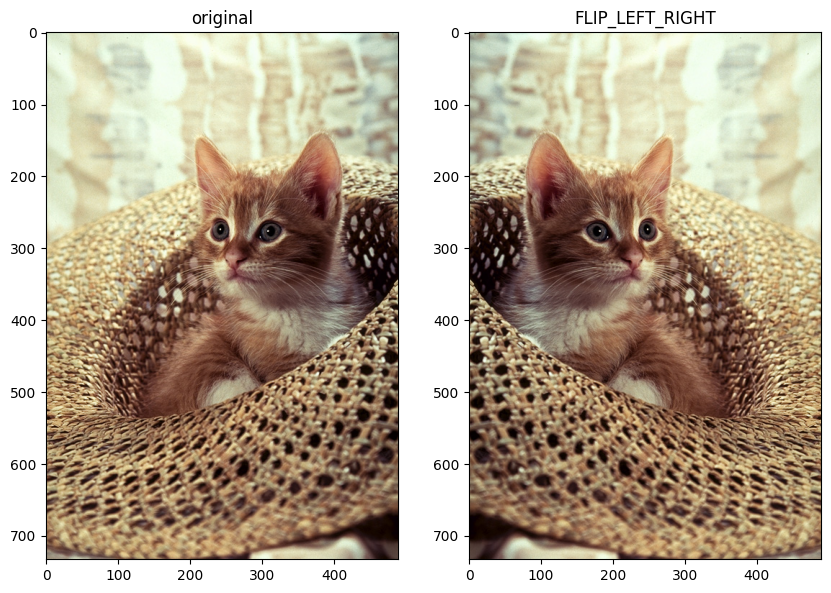

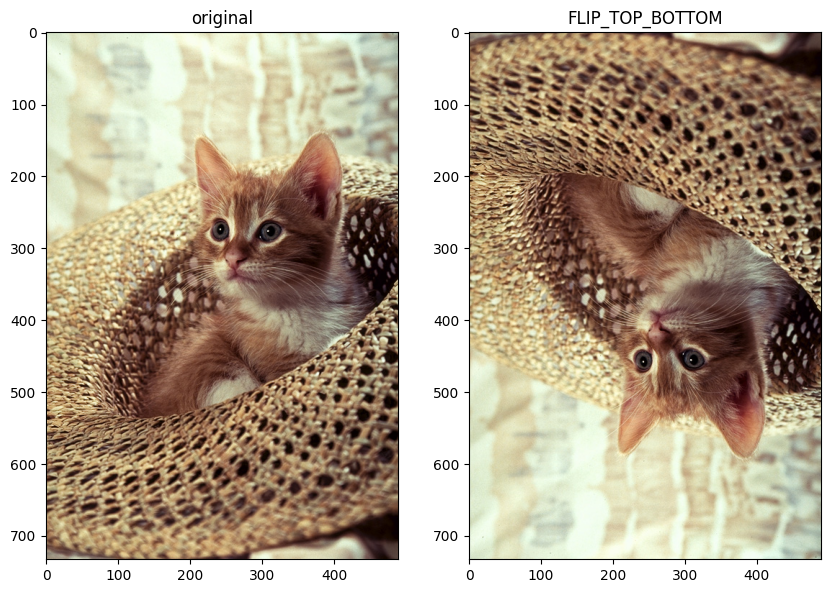

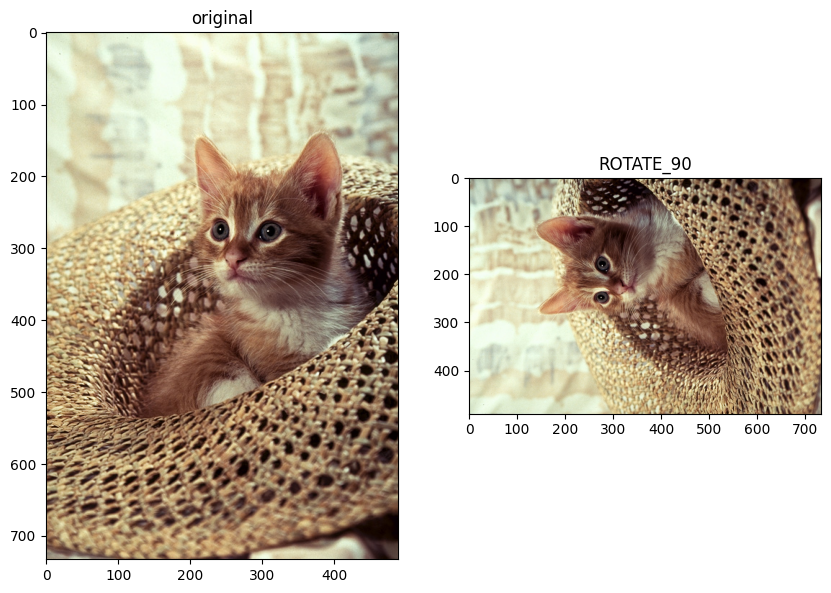

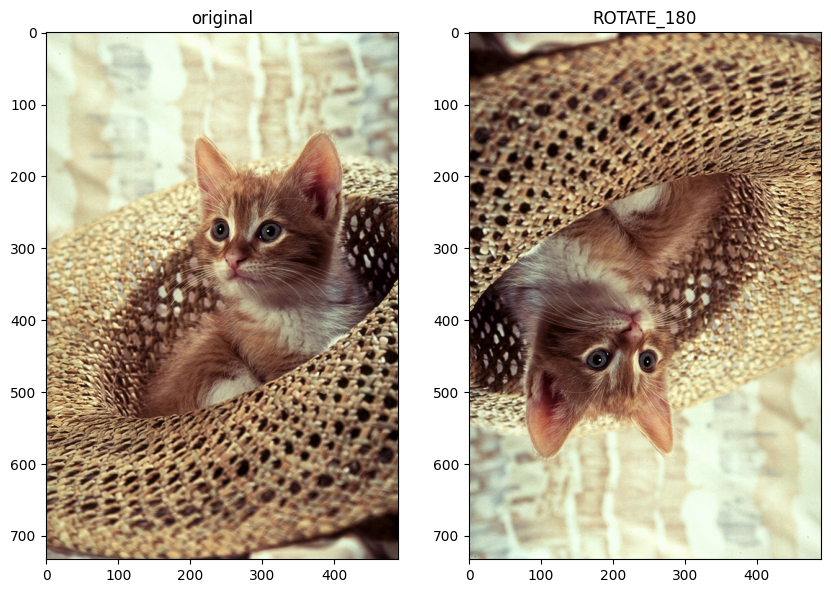

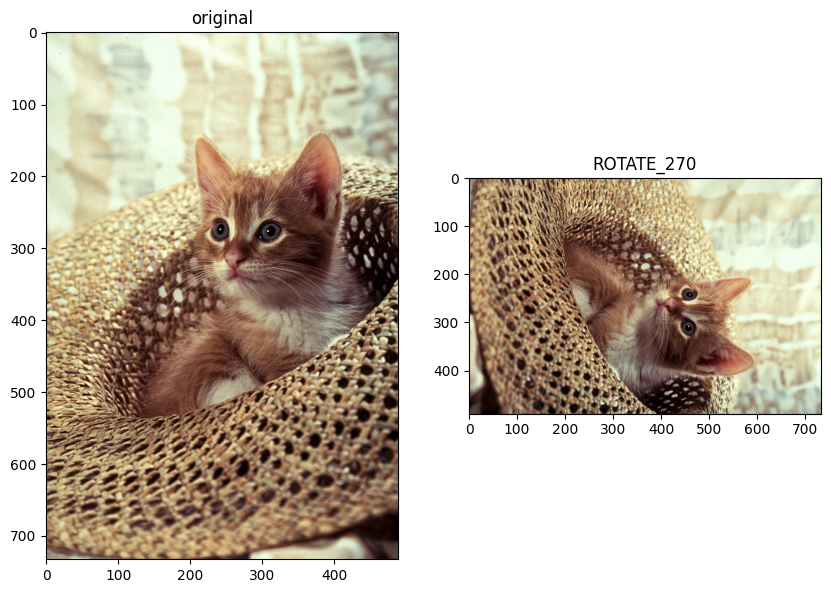

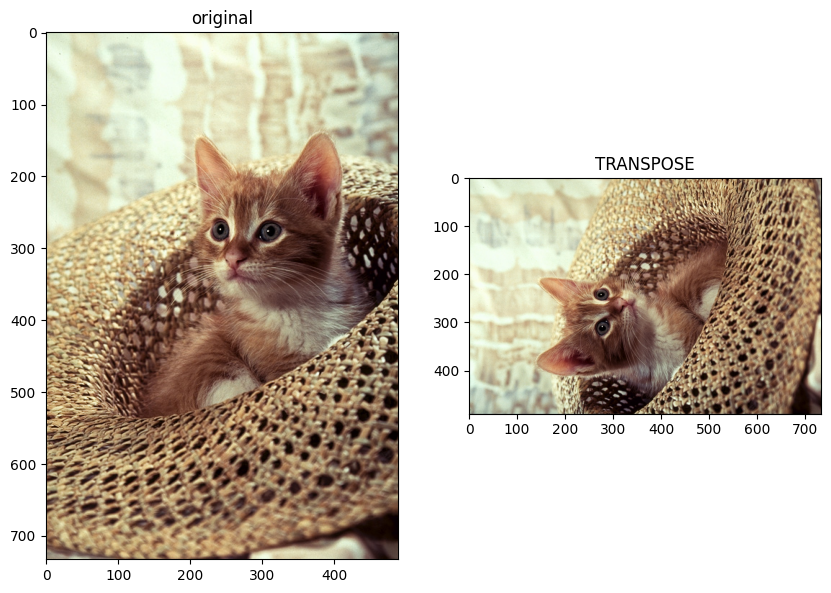

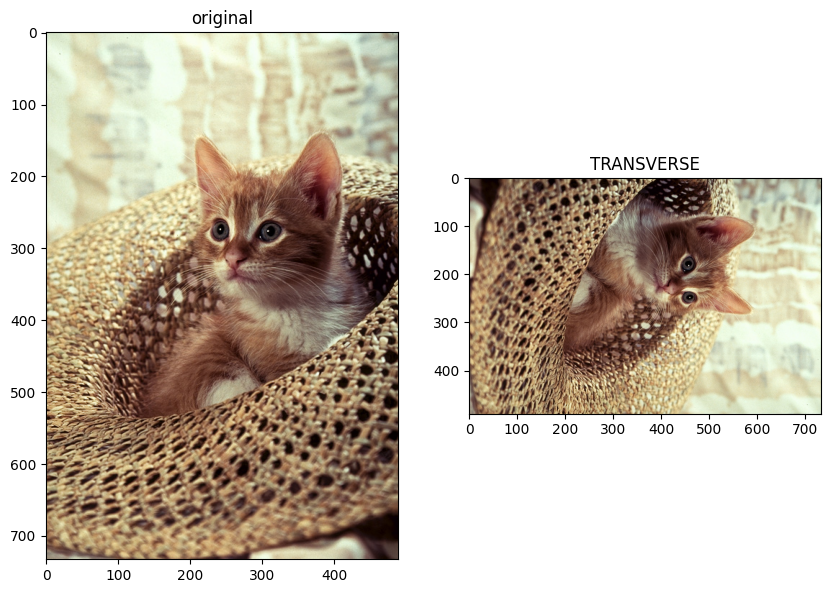

In [23]:
for key, values in flip.items():            # Duyệt từng kiểu lật/xoay trong dictionary
    plt.figure(figsize=(10,10))             # Tạo khung hiển thị 10x10 inch
    plt.subplot(1,2,1)                      # Chia khung thành 1 hàng 2 cột, ô bên trái
    plt.imshow(image)                       # Hiển thị ảnh gốc
    plt.title("original")                   # Tiêu đề ảnh gốc
    plt.subplot(1,2,2)                      # Ô bên phải
    plt.imshow(image.transpose(values))     # Hiển thị ảnh sau khi lật/xoay
    plt.title(key)                          # Tiêu đề theo tên phép biến đổi
    plt.show()                              # Hiển thị kết quả


 ## Cropping an Image


Cropping is the act of "cutting out" a part of an image and throwing out the rest. We can perform cropping using array slicing. 

Let start with a vertical crop: the variable `upper` is the index of the first row that we would like to include in the image, the variable `lower` is the index of the last row we would like to include. We then perform array slicing to obtain the new image. 


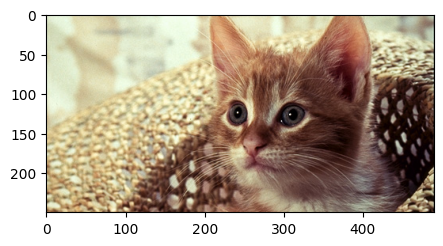

In [27]:
upper = 150                         # Dòng bắt đầu cắt ảnh
lower = 400                         # Dòng kết thúc cắt ảnh
crop_top = array[upper:lower, :, :] # Cắt ảnh 
plt.figure(figsize=(5,5))           # Tạo khung hiển thị 5x5 inch
plt.imshow(crop_top)                # Hiển thị phần ảnh đã cắt
plt.show()                          # Hiển thị ảnh


Consider the array `crop_top`: we can also crop horizontally. The variable `right` is the index of the first column that we would like to include in the image and the variable `left` is the index of the last column we would like to include in the image.


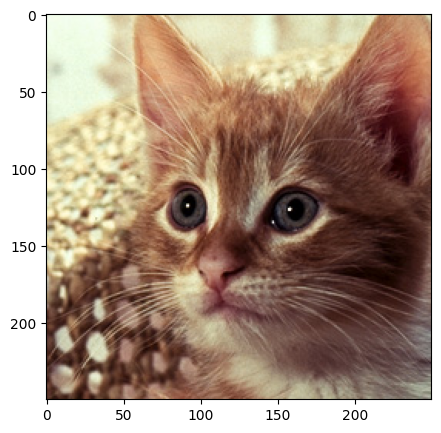

In [29]:
left = 150                              # Cột bắt đầu cắt ảnh
right = 400                            # Cột kết thúc cắt ảnh
crop_horizontal = crop_top[:, left:right, :]  # Cắt ảnh 
plt.figure(figsize=(5,5))               # Tạo khung hiển thị 5x5 inch
plt.imshow(crop_horizontal)             # Hiển thị phần ảnh đã cắt
plt.show()                              # Hiển thị ảnh


You can crop the PIL image using the <code>crop()</code> method, using the parameters from above Set the cropping area with <code>box=(left, upper, right, lower)</code>.


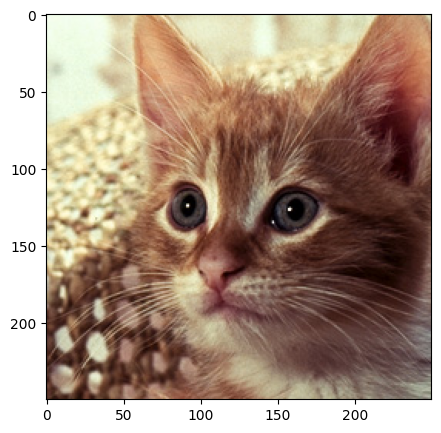

In [30]:
image = Image.open("cat.png")                 # Mở ảnh cat.png
crop_image = image.crop((left, upper, right, lower))# Cắt ảnh theo tọa độ (left, upper, right, lower)
plt.figure(figsize=(5,5))                     # Tạo khung hiển thị 5x5 inch
plt.imshow(crop_image)                        # Hiển thị ảnh đã cắt
plt.show()                                   # Hiển thị ảnh


We can also flip the new image:


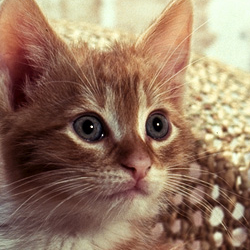

In [31]:
crop_image = crop_image.transpose(Image.FLIP_LEFT_RIGHT)# Lật ảnh đã cắt theo chiều ngang (trái ↔ phải)
crop_image    # Hiển thị đối tượng ảnh sau khi lật


## Changing Specific Image Pixels


We can change specific image pixels using  array indexing; for example, we can set  all the green and blue channels in the original image we cropped to zero:


In [34]:
array_sq = np.copy(array) # Tạo một bản sao của ảnh gốc
array_sq[upper:lower, left:right, 1:3] = 0 # Đặt kênh màu về 0 , vùng này chỉ chọn màu đỏ

We can compare the results with the new image. 


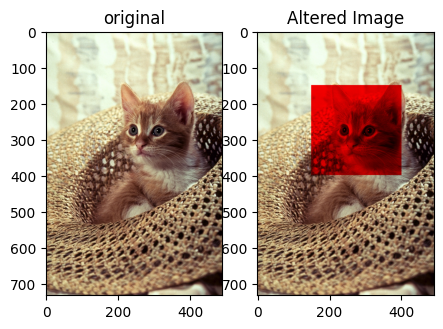

In [35]:
plt.figure(figsize=(5,5))          # Tạo khung hiển thị 5x5 inch
plt.subplot(1,2,1)                 # Chia khung thành 1 hàng 2 cột, ô bên trái
plt.imshow(array)                  # Hiển thị ảnh gốc
plt.title("original")              # Tiêu đề ảnh gốc
plt.subplot(1,2,2)                 # Ô bên phải
plt.imshow(array_sq)               # Hiển thị ảnh đã chỉnh sửa
plt.title("Altered Image")         # Tiêu đề ảnh đã thay đổi
plt.show()                         # Hiển thị tất cả ảnh


We can also use the `ImageDraw` module from `PIL` library, which provides simple 2D graphics for Image objects 


In [38]:
from PIL import ImageDraw  # Import ImageDraw để vẽ hình 

We will copy the image object:


In [37]:
image_draw = image.copy() # Tạo một bản sao của ảnh

The draw constructor creates an object that can be used to draw in the given image. The input <code>im</code> is the image we would like to draw in.



In [39]:
image_fn = ImageDraw.Draw(im=image_draw) # Tạo đối tượng vẽ để có thể vẽ hình

Whatever method we apply to the object <code>image_fn</code>, will change the image object <code>image_draw</code>.


We can draw a rectangle using the <code>rectangle</code> function, two important parameters include: <code>xy</code> – the coordinates bounding box  and <code>fill</code> – Color of the rectangle.


In [40]:
shape = [left, upper, right, lower]     # Xác định tọa độ hình chữ nhật cần vẽ
image_fn.rectangle(xy=shape, fill="red")  # Vẽ hình chữ nhật màu đỏ lên ảnh theo tọa độ đã cho


We can plot the image.


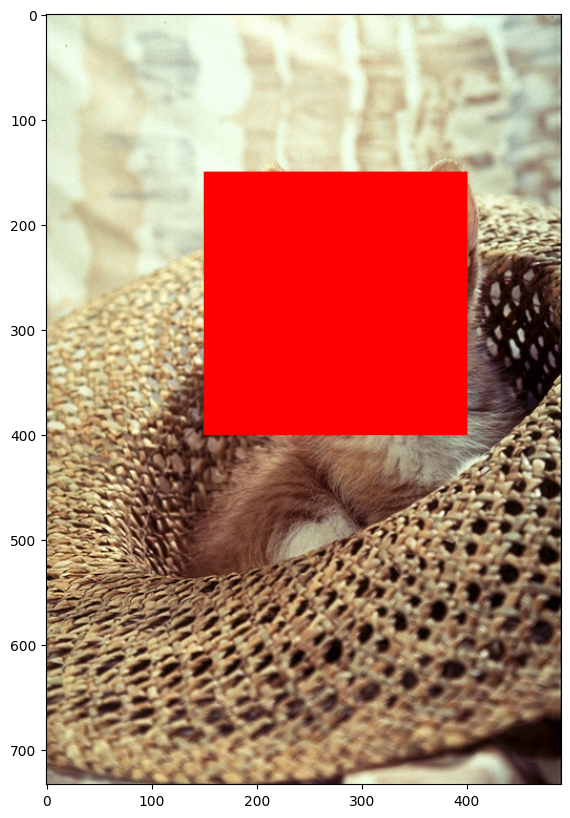

In [41]:
plt.figure(figsize=(10,10))   # Tạo khung hiển thị 10x10 inch
plt.imshow(image_draw)        # Hiển thị ảnh đã vẽ hình chữ nhật
plt.show()                    # Hiển thị ảnh


There are other shapes we can use. For example, we can also overlay text on an image: we use the ImageFont module to obtain  bitmap fonts.


In [42]:
from PIL import ImageFont   # Import ImageFont để dùng font chữ khi viết text lên ảnh


We use the text method to place the text on the image. The parameters include `xy` (the top-left anchor coordinates of the text), the parameter `text` (the text to be drawn), and `fill` (the color to use for the text).


In [43]:
image_fn.text(xy=(0,0), text="box", fill=(0,0,0))# Ghi chữ "box" tại vị trí (0,0) với màu đen lên ảnh


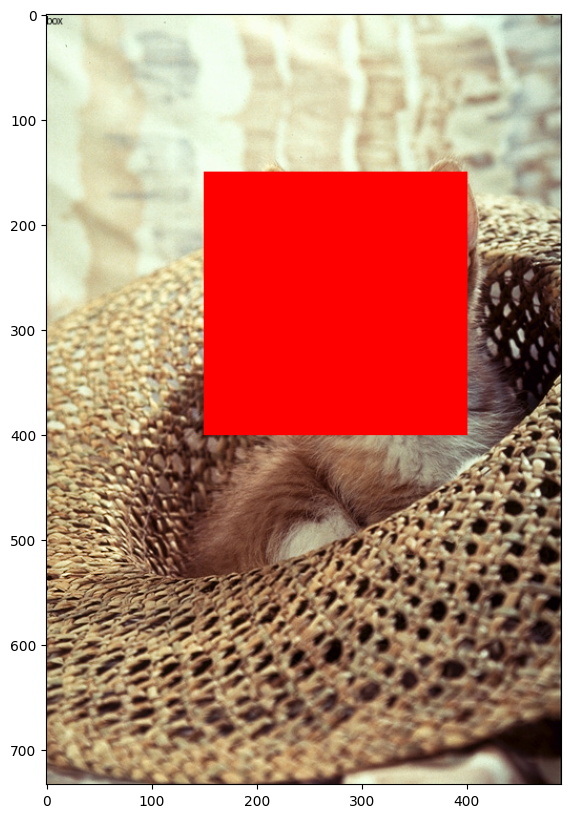

In [44]:
plt.figure(figsize=(10,10))   # Tạo khung hiển thị 10x10 inch
plt.imshow(image_draw)        # Hiển thị ảnh đã vẽ hình và chữ
plt.show()                    # Hiển thị ảnh


We can overlay or paste one image over another by reassigning the pixel for one array to the next. Consider the following image array:


In [45]:
image_lenna = Image.open("lenna.png")   # Mở ảnh lenna.png
array_lenna = np.array(image_lenna)     # Chuyển ảnh sang mảng NumPy để xử lý


We can reassign the pixel values as follows:


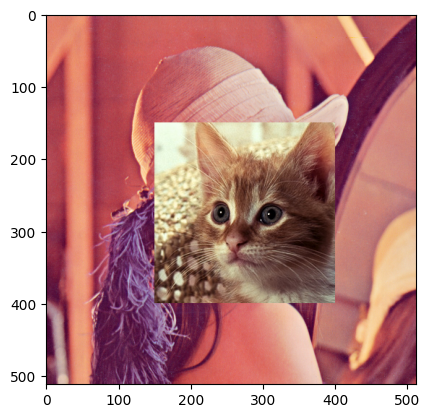

In [46]:
array_lenna[upper:lower, left:right, :] = array[upper:lower, left:right, :]# Sao chép một vùng ảnh từ array (cat) sang array_lenna (lenna)
plt.imshow(array_lenna)   # Hiển thị ảnh lenna sau khi ghép
plt.show()                # Hiển thị ảnh


In the same manner, the <code>paste()</code> method allows you to overlay one image over another, with the input being the image you would like to overlay. The parameter box is the left and upper coordinate of the image:


In [47]:
image_lenna.paste(crop_image, box=(left, upper))# Dán ảnh crop_image vào ảnh image_lenna tại vị trí (left, upper)


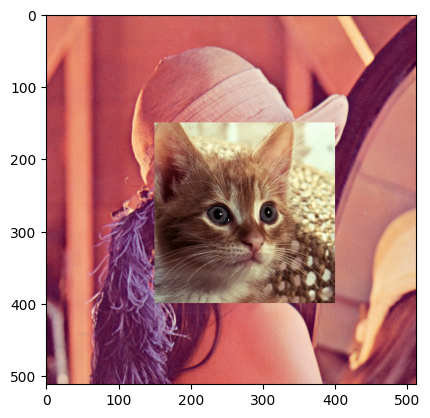

In [49]:
plt.imshow(image_lenna)   # Hiển thị ảnh lenna sau khi dán ảnh con
plt.show()                # Hiển thị ảnh


We can see the method `copy()` applies to some <code>PIL</code> objects. We create two image objects, we set `new_image` to the `image`, and we use the method `copy()` for the `copy_image` object.


In [51]:
image = Image.open("cat.png")   # Mở ảnh cat.png
new_image = image              # Gán new_image trỏ tới cùng ảnh với image
copy_image = image.copy()      # Tạo một bản sao mới của ảnh image


Like the array, we see that the same memory address relationship exists. For example, if we don't use the method `copy()`, the image object has the same memory address as the original PIL image object. 


In [52]:
id(image) == id(new_image)   # Kiểm tra image và new_image có cùng vùng nhớ hay không


True

If we use the method <code>copy()</code>, the address is different:


In [53]:
id(image) == id(copy_image)   # Kiểm tra image và copy_image có cùng vùng nhớ hay không


False

If we change the object <code>image</code>, <code>new_image</code> will change, but <code>copy_image</code> will remain the same:


In [54]:
image_fn = ImageDraw.Draw(im=image)      # Tạo đối tượng để vẽ trực tiếp lên ảnh image
image_fn.text(xy=(0,0), text="box", fill=(0,0,0))  # Ghi chữ "box" ở góc trên bên trái, màu đen
image_fn.rectangle(xy=shape, fill="red")  # Vẽ hình chữ nhật màu đỏ theo tọa độ shape


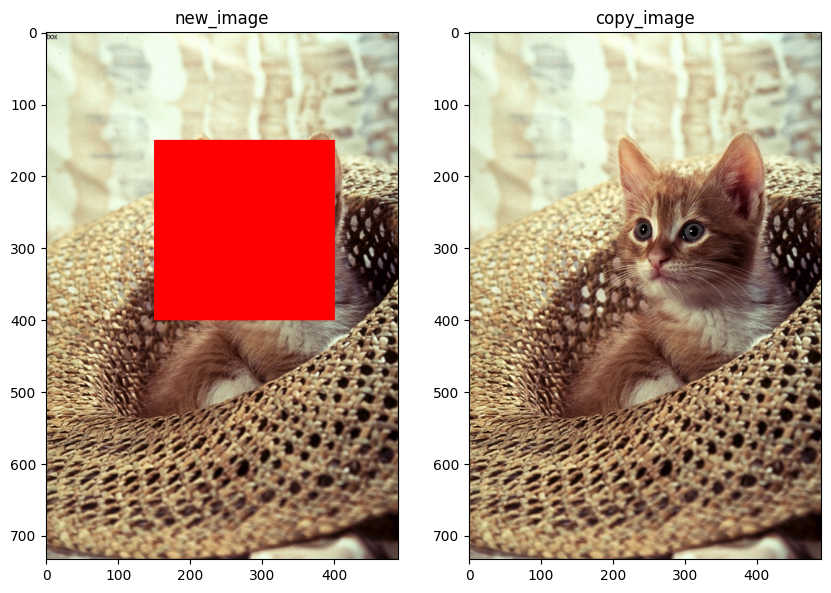

In [55]:
plt.figure(figsize=(10,10))      # Tạo khung hiển thị 10x10 inch
plt.subplot(121)                 # Chia khung thành 1 hàng 2 cột, ô bên trái
plt.imshow(new_image)            # Hiển thị new_image (bị thay đổi vì dùng chung vùng nhớ)
plt.title("new_image")
plt.subplot(122)                 # Ô bên phải
plt.imshow(copy_image)           # Hiển thị copy_image (không bị ảnh hưởng)
plt.title("copy_image")
plt.show()                       # Hiển thị cả hai ảnh


### Question 1:
Use the image `baboon.png` from this lab or take any image you like.

Open the image and create a PIL Image object called `im`, flip `im` and create an image called `im_flip`. Mirror `im` and create an image called `im_mirror`. Finally, plot both images.


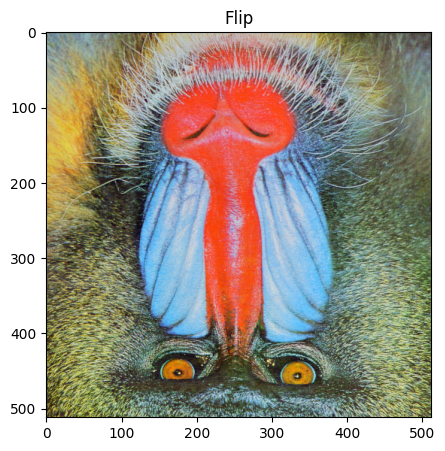

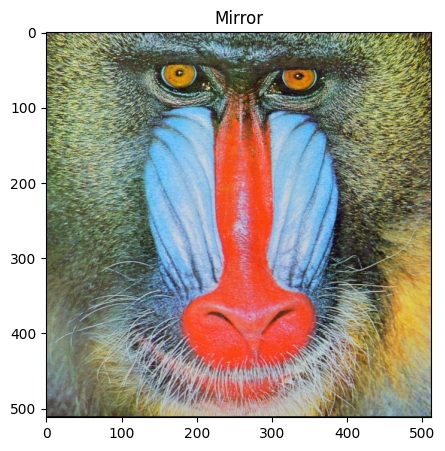

In [56]:
from PIL import Image, ImageOps
import matplotlib.pyplot as plt

im = Image.open("baboon.png")      # Mở ảnh và tạo đối tượng PIL Image

im_flip = ImageOps.flip(im)        # Lật ảnh theo chiều dọc
im_mirror = ImageOps.mirror(im)    # Lật ảnh theo chiều ngang

plt.figure(figsize=(5,5))
plt.imshow(im_flip)                # Hiển thị ảnh đã lật
plt.title("Flip")
plt.show()

plt.figure(figsize=(5,5))
plt.imshow(im_mirror)              # Hiển thị ảnh đã mirror
plt.title("Mirror")
plt.show()



Double-click **here** for a hint.

<!-- The hint is below:

im_flip = ImageOps.flip(im)
im_mirror = ImageOps.mirror(im)

-->


Double-click **here** for the solution.

<!-- The answer is below:

im = Image.open("lenna.png")

im_flip = ImageOps.flip(im)
plt.figure(figsize=(5,5))
plt.imshow(im_flip)
plt.show()

im_mirror = ImageOps.mirror(im)
plt.figure(figsize=(5,5))
plt.imshow(im_mirror)
plt.show()

-->


# References 


[1]  Images were taken from: https://homepages.cae.wisc.edu/~ece533/images/
    
[2]  <a href='https://pillow.readthedocs.io/en/stable/index.html'>Pillow Docs</a>

[3]  <a href='https://opencv.org/'>Open CV</a>

[4] Gonzalez, Rafael C., and Richard E. Woods. "Digital image processing." (2017).


<!--<h2>Change Log</h2>-->
